[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/EagleDad/DEEP-LEARNING-WITH-PYTORCH/blob/master/applications/kaggleCompetitionClassification/kaggleCompetitionClassification.ipynb)

# Introduction

Meanwhile I'm used to Google Colab, so I decided to run this project in Colab instead of using kaggle kernels. The link above directly opens the notwbook in Colab and of the end of the notebook I've shared the link to the repository of this notebook.

To not download the data for the competition everytime I mounted my google drive for storing the data there. I also did the splitting by 80:20 initially to gusrantee that the data stays consistend.

The following code shows how I downloaded the data for the competition from kaggle and how I did the 80:20 split for trainign and validation.

With 6000 images, the dataset is also not as big as it could be. Learning the network from scratch might work, but I'll consider transfered learning using a pre-trained network.

To get "more" data, data augmentation will be applied to the training data, further information below.

I also experimented with different kind of lerning-rate-schedules. The versions are documented in the Model definition and the resulting tensor-borad logs for the run are stored in my GitHub.

Some runs I also had to continue from the last checkpoint because my Colab session reach the IDLE timeout.


In [1]:
#
# Mount Google Drive here to store results of training and keep them if a session expires
#
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Creating the required folder structures**

In [ ]:
%cd /content/drive/MyDrive/DLPT/Project2

/content/drive/MyDrive/DLPT/Project2


In [ ]:
%mkdir -p data_root/training/training

In [ ]:
%mkdir -p data_root/validation/validation

In [ ]:
!pip install -q kaggle

**To be able to access data from kaggle, the API token needs to be loaded here**

In [ ]:
from google.colab import files
_ = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list

ref                                                           title                                            size  lastUpdated          downloadCount  voteCount  usabilityRating  
------------------------------------------------------------  ----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
rabieelkharoua/students-performance-dataset                   📚 Students Performance Dataset 📚                 66KB  2024-06-12 23:09:20          25028        507  1.0              
waqi786/cars-dataset-2010-2020                                Cars Dataset (2010-2020)                         96KB  2024-07-23 05:49:46           1467         29  1.0              
marius2303/nissan-all-models-price-prediction-dataset         Nissan All Models Price Prediction Dataset      811KB  2024-07-27 11:50:10            788         24  1.0              
ihelon/coffee-sales                                           Coffee Sales                

In [ ]:
#! kaggle competitions download -c '10 Monkey Species'
!kaggle competitions download -c opencv-pytorch-classification-project-2

100% 1.29G/1.29G [00:25<00:00, 33.9MB/s]
100% 1.29G/1.29G [00:25<00:00, 55.5MB/s]


In [ ]:
!unzip -q 'opencv-pytorch-classification-project-2.zip'

In [ ]:
!rm -rf 'opencv-pytorch-classification-project-2.zip'

In [2]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import shutil

In [3]:
#
# Define the required paths variables here
#
csv_file = '/content/drive/MyDrive/DLPT/Project2/train.csv'
test_csv_file = '/content/drive/MyDrive/DLPT/Project2/test.csv'
source_dir = '/content/drive/MyDrive/DLPT/Project2/images/images'
train_dir = '/content/drive/MyDrive/DLPT/Project2/data_root/training/training'
val_dir = '/content/drive/MyDrive/DLPT/Project2/data_root/validation/validation'
test_dir = '/content/drive/MyDrive/DLPT/Project2/test/test'
base_dir = '/content/drive/MyDrive/DLPT/Project2/data_root/'
data_root = base_dir

In [ ]:
#
# Load the CSV file
#
data = pd.read_csv(csv_file)

In [ ]:
#
# Split the data (80 : 20)
#
train_data, val_data = train_test_split(data, test_size=0.2, stratify=data['class'])

# Show the result of the splitting
print("Data: ", data)
print("Trainig: ", train_data)
print("Validation: ", val_data)

Data:                          id       class
0     14278962987112149800     githeri
1     13190220095752321996       ugali
2     10431803432626641638  kachumbari
3      4222441716327528413     githeri
4      2547906925836120627      matoke
...                    ...         ...
6531   9491780363201908054      matoke
6532    938716700684692863     chapati
6533  12487998559342412135       ugali
6534   3466916091782561952  kachumbari
6535   4410319397208590457     chapati

[6536 rows x 2 columns]
Trainig:                          id       class
4551   2937366383558488773     chapati
1178  17530272069501959246  nyamachoma
1642   2069657870602803954   kukuchoma
1699   1098573203162321131     githeri
2997   3863261994188150700     githeri
...                    ...         ...
5903  12653237353722769106  nyamachoma
4748   6329826092957805988       ugali
641   15721740844179914369     githeri
6183  14251218500965074461   kukuchoma
1685   6047317205398611449     githeri

[5228 rows x 2 column

In [ ]:
#
# Function to create directories for classes
#
def create_class_dirs(base_dir, classes):
    for class_name in classes:
        class_dir = os.path.join(base_dir, class_name)
        os.makedirs(class_dir, exist_ok=True)

In [ ]:
#
# Create the directories
#
classes = data['class'].unique()
create_class_dirs(train_dir, classes)
create_class_dirs(val_dir, classes)

In [ ]:
#
# Function to move training images to the defined class folder
#
def move_images(data, source_dir, target_base_dir):
    for _, row in data.iterrows():
        img_name = str(row['id'])
        class_name = row['class']
        src_path = os.path.join(source_dir, img_name + '.jpg')
        dest_dir = os.path.join(target_base_dir, class_name)
        shutil.move(src_path, dest_dir)

In [ ]:
#
# Function to move final test images. This function is diffeent, bacause for
# the final test images we do not have the class name
#
def move_test_images(data, source_dir, target_base_dir):
    for _, row in data.iterrows():
        img_name = str(row['id'])
        #class_name = row['class']
        src_path = os.path.join(source_dir, img_name + '.jpg')
        dest_dir = os.path.join(target_base_dir, img_name + '.jpg')
        shutil.move(src_path, dest_dir)

In [ ]:
#
# Move training images
#
move_images(train_data, source_dir, train_dir)

In [ ]:
#
# Move final validation images
#
move_images(val_data, source_dir, val_dir)

In [ ]:
#
# Move trai.csv to data folder
#
shutil.move(csv_file, base_dir)

'/content/drive/MyDrive/DLPT/Project2/data_root/train.csv'

In [ ]:
#
# Load the test CSV file
#
test_data = pd.read_csv(test_csv_file)

In [ ]:
print("Test Data: ", test_data)

Test Data:                          id
0      9156739011499789258
1      2049465964503133373
2      6446998501027132988
3      4194396063119815321
4      9018117998187006009
...                    ...
1633  18302448610371772604
1634  15920672464676076400
1635   3232020170382870007
1636   3094804487341098468
1637   5827342261332058667

[1638 rows x 1 columns]


In [ ]:
#
# Move test images
#
move_test_images(test_data, source_dir, test_dir)

In [4]:
#
# Install pytorch-lightning since it is not installed on colab
#
!pip install pytorch-lightning

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [5]:
import torch
import torchvision

import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import MultiStepLR

from torchvision import transforms, datasets, models
#from torchvision.transforms import functional as F
import torch.nn.functional as F
# convert image tensor to PIL image and in range 0-255
from torchvision.transforms.functional import to_pil_image

from torch.optim.lr_scheduler import ReduceLROnPlateau

import pytorch_lightning as pl
# Importing EarlyStopping callback
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

# Use Module API to track and compute metrics automatically
from torchmetrics import MeanMetric
from torchmetrics.classification import MulticlassAccuracy

import matplotlib.pyplot as plt

from operator import itemgetter

from dataclasses import dataclass

import random
import csv

import os

import ssl
import itertools

import numpy as np
import pandas as pd

from PIL import Image

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, confusion_matrix, ConfusionMatrixDisplay

# filter UserWarning
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

# **Change working directory to store all data in GitHub for submission**

In [6]:
%cd /content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification

/content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification


In [7]:
os.chdir('/content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification')

# <font style="color:blue">Project 2: Kaggle Competition - Classification</font>

#### Maximum Points: 100

<div>
    <table>
        <tr><td><h3>Sr. no.</h3></td> <td><h3>Section</h3></td> <td><h3>Points</h3></td> </tr>
        <tr><td><h3>1</h3></td> <td><h3>Data Loader</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>2</h3></td> <td><h3>Configuration</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>3</h3></td> <td><h3>Evaluation Metric</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>4</h3></td> <td><h3>Train and Validation</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>5</h3></td> <td><h3>Model</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>6</h3></td> <td><h3>Utils</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>7</h3></td> <td><h3>Experiment</h3></td><td><h3>5</h3></td> </tr>
        <tr><td><h3>8</h3></td> <td><h3>TensorBoard Log</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>9</h3></td> <td><h3>Kaggle Profile Link</h3></td> <td><h3>50</h3></td> </tr>
    </table>
</div>


## <font style="color:green">1. Data Loader [10 Points]</font>

In this section, you have to write a class or methods, which will be used to get training and validation data loader.

You need to write a custom dataset class to load data.

**Note; There is   no separate validation data. , You will thus have to create your own validation set, by dividing the train data into train and validation data. Usually, we do 80:20 ratio for train and validation, respectively.**


For example:

```python
class KenyanFood13Dataset(Dataset):
    """
    
    """
    
    def __init__(self, *args):
    ....
    ...
    
    def __getitem__(self, idx):
    ...
    ...
    
    
```

```
def get_data(args1, *agrs):
    ....
    ....
    return train_loader, test_loader
```

# Dataloader and required functions

I decided to use pytorch-lightning infrastructure for transfered learning.
The following code shows the pytorch-lightning DataModule and required functions for image transformations and mean/standard deviation calculation.

The splitting of the data is done above on my Google drive

In [8]:
%matplotlib inline

In [9]:
%load_ext autoreload
%autoreload 2

In [10]:
#
# The image preproessing
#
def image_preprocess_transforms():

    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor()
        ])

    return preprocess

In [11]:
#
# The common image transform applied to traning and validation.
# All images have to have a size of 224 x 224.
# A common approach for training a neural network is to normalize the data
# with the mean and standard deviation form the trainign data. Thsi step is applied here.
#
def image_common_transforms(mean=(0.5774, 0.4624, 0.3455), std=(0.2696, 0.2737, 0.2826)):
    preprocess = image_preprocess_transforms()

    common_transforms = transforms.Compose([
        preprocess,
        transforms.Normalize(mean, std)
    ])

    return common_transforms

# Data Augmentation

The data set is not as big, so data aumentation is applied to simulate more data. Which data augmentation was used in which version, can be seen in the comments in the function.

1.   Color Jitter: Adjusting brightness, contrast, saturation, and hue to simulate different lighting conditions.
2.   Random Resized Crop: Randomly cropping and resizing can help the model learn food items from different perspectives.
3.   Horizontal Flip: Since food can be plated in various ways, horizontal flipping can help the model generalize better.
4.   Random Rotation: Slight rotations can simulate different angles of the same food item.
5.   Random Perspective: Slight perspective changes can help in making the model more robust to distortions.
6.   Random Grayscale: Occasionally converting the image to grayscale can help the model focus on texture rather than color.
7.   Random Erasing: This technique randomly erases parts of an image during training, which helps the model learn to focus on different parts of the image.

















In [12]:
#
# The data augmentation function for the training step
#
def data_augmentation_preprocess(mean=(0.5774, 0.4624, 0.3455), std=(0.2696, 0.2737, 0.2826)):

  commonTransforms = image_common_transforms(mean, std)

  # VERSION 0 - 5
  #augmentation_transforms = transforms.Compose([
  #      transforms.RandomChoice([
  #          transforms.RandomResizedCrop(224),  # Randomly crop the image to 224x224
  #          transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
  #          transforms.RandomRotation(20),      # Randomly rotate the image by up to 20 degrees
  #          transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),  # Randomly change the brightness, contrast, saturation, and hue
  #      ]),
  #      commonTransforms
  #  ])

  # VERSION 6 - 8
  #augmentation_transforms = transforms.Compose([
  #      transforms.RandomChoice([
  #          transforms.RandomResizedCrop(224),  # Randomly crop the image to 224x224
  #          transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
  #          transforms.RandomRotation(20),      # Randomly rotate the image by up to 20 degrees
  #          transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),  # Randomly change the brightness, contrast, saturation, and hue
  #          transforms.RandomPerspective(distortion_scale=0.1, p=0.5),
  #          transforms.RandomGrayscale(p=0.1)
  #      ]),
  #      commonTransforms
  #  ])

  # VERSION 9 - 13
  augmentation_transforms = transforms.Compose([
        transforms.RandomChoice([
            transforms.RandomResizedCrop(224),  # Randomly crop the image to 224x224
            transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
            transforms.RandomRotation(20),      # Randomly rotate the image by up to 20 degrees
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),  # Randomly change the brightness, contrast, saturation, and hue
            transforms.RandomPerspective(distortion_scale=0.1, p=0.5),
            transforms.RandomGrayscale(p=0.1),
            transforms.RandomVerticalFlip()# since version 9
        ]),
        commonTransforms,
        transforms.RandomErasing(p=0.5, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # sine version 9
    ])


  return augmentation_transforms

In [13]:
#
# Function to calculate the mean and deviation of the (training) data set.
# It is common practice to normalize the data by mean and deviation. Here we
# calculate the mean and deviation of the trainign data set
#
def get_mean_std(data_root, num_workers=4):

  data_module = KenyanFood13DataModule(
    batch_size = 64,
    num_workers = 8
  )
  data_module.setup()

  loader = data_module.mean_std_dataloader()

  batch_mean = torch.zeros(3)
  batch_mean_sqrd = torch.zeros(3)

  for batch_data, _ in loader:
      batch_mean += batch_data.mean(dim=(0, 2, 3)) # E[batch_i]
      batch_mean_sqrd += (batch_data ** 2).mean(dim=(0, 2, 3)) #  E[batch_i**2]

  # E[dataset] = E[E[batch_1], E[batch_2], ...]
  mean = batch_mean / len(loader)

  # var[X] = E[X**2] - E[X]**2

  # E[X**2] = E[E[batch_1**2], E[batch_2**2], ...]
  # E[X]**2 = E[E[batch_1], E[batch_2], ...] ** 2

  var = (batch_mean_sqrd / len(loader)) - (mean ** 2)

  std = var ** 0.5
  print('mean: {}, std: {}'.format(mean, std))

  return mean, std

In [ ]:
#
# Calculate mean and deviation
#
mean, std = get_mean_std(data_root)

mean: tensor([0.5774, 0.4624, 0.3455]), std: tensor([0.2696, 0.2737, 0.2826])


# Shortcut for testing
Since calculating mean and deviation takes some time, I have a shortcut here. The mean and deviation will not change later on since the date is always the sme.

In [14]:
npMean = [0.5774, 0.4624, 0.3455]
mean = torch.tensor(npMean)

npStd = [0.2696, 0.2737, 0.2826]
std = torch.tensor(npStd)

print('mean: {}, std: {}'.format(mean, std))

mean: tensor([0.5774, 0.4624, 0.3455]), std: tensor([0.2696, 0.2737, 0.2826])


# The pytorch-lighnig data module

Here we define the final pytorch-lighning data module.

The prepareData step is not required this we have done this initally. Doing it all the time the data module is created just takes time that can be avoided. We just reffer to the existing data.

We also define data augmentation to be used for training.

In [15]:
class KenyanFood13DataModule(pl.LightningDataModule):

  def __init__(self, batch_size, num_workers, mean=(0.5774, 0.4624, 0.3455), std=(0.2696, 0.2737, 0.2826)):

    super().__init__()

    self.batch_size = batch_size
    self.num_workers = num_workers
    self.data_root = data_root

    preprocess = image_preprocess_transforms()

    self.common_transforms = image_common_transforms(mean, std)

    self.aug_transforms = data_augmentation_preprocess(mean, std)

    self.mean_std_transform = image_preprocess_transforms()

  def prepare_data(self):

    # Note: We have prepared the dataset initialy and stored in on GoogleDrive
    # to not have to download and spilt with each run
    print("Preparing KenyanFood13 dataset")
    print("Preparation completed.")

  def setup(self, stage = None):

    train_data_path = os.path.join(self.data_root, "training", "training")
    val_data_path = os.path.join(self.data_root, "validation", "validation")

    self.train_dataset = datasets.ImageFolder(
      root = train_data_path,
      transform = self.aug_transforms
    )

    self.mean_std_dataset = datasets.ImageFolder(
      root = train_data_path,
      transform = self.mean_std_transform
    )

    self.val_dataset = datasets.ImageFolder(
      root = val_data_path,
      transform = self.common_transforms
    )

  def train_dataloader(self):

    # train loader
    train_loader = torch.utils.data.DataLoader(
      self.train_dataset,
      batch_size = self.batch_size,
      shuffle = True,
      num_workers = self.num_workers,
    )

    return train_loader

  def mean_std_dataloader(self):

    # mean std loader
    mean_std_loader = torch.utils.data.DataLoader(
      self.mean_std_dataset,
      batch_size = self.batch_size,
      shuffle = False,
      num_workers = self.num_workers,
    )

    return mean_std_loader

  def val_dataloader(self):

    # validation loader
    test_loader = torch.utils.data.DataLoader(
      self.val_dataset,
      batch_size = self.batch_size,
      shuffle = False,
      num_workers = self.num_workers,
    )

    return test_loader

# Show a image from the data set to make sure the dataloader behaves as expected

Length of the dataset: 5228
torch.Size([3, 224, 224])
0
Label: 0, common name: bhaji


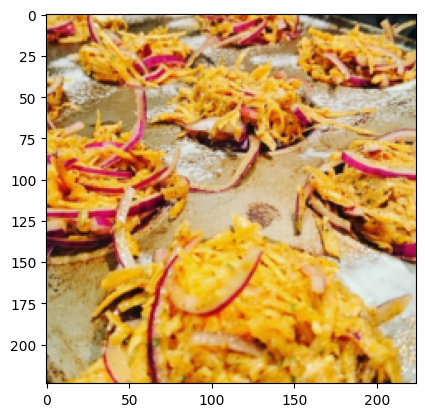

In [ ]:
train_dataset = KenyanFood13DataModule(
    batch_size = 64,
    num_workers = 8
  )
train_dataset.setup()

print('Length of the dataset: {}'.format(len(train_dataset.train_dataset)))

img, trgt = train_dataset.mean_std_dataset[0]

idx_to_class_name = {j: i for i, j in train_dataset.train_dataset.class_to_idx.items()}

print(img.shape)
print(trgt)

img = to_pil_image(img)

print('Label: {}, common name: {}'.format(trgt, idx_to_class_name[trgt]))

plt.imshow(img)
plt.show()

## <font style="color:green">2. Configuration [5 Points]</font>

**Define your configuration here.**

For example:


```python
@dataclass
class TrainingConfiguration:
    '''
    Describes configuration of the training process
    '''
    batch_size: int = 10
    epochs_count: int = 50  
    init_learning_rate: float = 0.1  # initial learning rate for lr scheduler
    log_interval: int = 5  
    test_interval: int = 1  
    data_root: str = "/kaggle/input/opencv-pytorch-classification-project-2/"
    num_workers: int = 2  
    device: str = 'cuda'  
    
```

In [16]:
torch.set_float32_matmul_precision('high')

# Training Configuration Class
The following describes the configuration object for training. All parameters required for the training process, like number of epochs, initial lerning rate and so on will be defined here.


**Small Batch Sizes (8-32):**
*   Pros: Smaller batch sizes can provide better generalization and allow the model to escape local minima more easily.
*   Cons: Training might be slower, and the gradient estimates may be noisier, requiring more iterations.

**Medium Batch Sizes (32-128):**
*   Pros: Provides a good balance between stable gradient estimates and efficient use of hardware.
*   Cons: May still require some tuning of the learning rate.

**Large Batch Sizes (128-512 or more):**
*   Pros: Faster convergence per epoch, more stable gradient estimates.
*   Cons: Requires significant GPU memory, and there's a risk of poorer generalization.

In [38]:
@dataclass(frozen=True)
class TrainingConfiguration:
    '''
    Describes configuration of the training process
    '''
    batch_size: int = 32  # From version 12. Versions 0 - 11 with 64, version 11 with 128
    epochs_count: int = 75
    learning_rate: float = 0.01  # initial learning rate for lr scheduler
    log_interval: int = 5
    test_interval: int = 1
    data_root: str = f"data_root"
    num_workers: int = 10 # 2 is reccomended by colab. Higher numbers result in a warning
    device: str = 'cuda'
    #model_name: str = f"resnet50"  # VERSION 0 - 10
    model_name: str = f"resnet101"  # VERSION 11 - 12 and 14
    #model_name: str = f"resnet18"  # VERSION 13
    weights: str = "DEFAULT"
    fine_tune_start: int = 3
    precision: str = "16-mixed"

# The data configuration object
All parameters releated to the dataset like number of classe, root directory and so on should be defined here.

In [39]:
@dataclass(frozen=True)
class DataConfiguration:
    data_root: str = f"data_root"
    num_workers: int = 8
    batch_size: int = 32 # From version 12. Versions 0 - 11 with 64, version 11 with 128
    num_classes = 13

# The System Configuration Class
All system relevant varables like seed, cuda should be definded here.

In [40]:
@dataclass
class SystemConfiguration:
    '''
    Describes the common system setting needed for reproducible training
    '''
    seed: int = 21  # seed number to set the state of all random number generators
    cudnn_benchmark_enabled: bool = True  # enable CuDNN benchmark for the sake of performance
    cudnn_deterministic: bool = True  # make cudnn deterministic (reproducible training)

In [41]:
#
# Create the objects defined above for later access.
#
data_config = DataConfiguration()
train_config = TrainingConfiguration()
sys_config = SystemConfiguration()

## <font style="color:green">3. Evaluation Metric [10 Points]</font>

**Define methods or classes that will be used in model evaluation. For example, accuracy, f1-score etc.**

In [21]:
#
# Function that is plotting the confusuin matric using matplotlib
#
def plot_confusion_matrix(cm,
                          classes,
                          normalise = False,
                          title = 'Confusion matrix',
                          cmap = plt.cm.Reds):

    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 45)
    plt.yticks(tick_marks, classes)

    if normalise:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
        cm = cm.round(2)

    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment = "center",
                 color = "white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [22]:
#
# Generating the classification report for checking the model's performance on the test set of the same dataset
#
def generate_classification_report(targetNames, predictedNames):
  cr = classification_report(targetNames, predictedNames)
  print("CLASSIFICATION REPORT")
  print(cr)
  print("")
  return cr

In [23]:
#
# Generating confusion matrix to see where the model is misclassifying
#
def generate_confusion_matrix(targetNames, predictedNames):
  cm = confusion_matrix(targetNames, predictedNames)
  print("Confusion Matrix")
  print( cm )
  print("")
  return cm

In [24]:
#
# This methode is used to calculate and viualize (a sample set) to get an idea
# about the results and the model performance. Scorces and confunsion matrix
# will be printed and plotted at the end of the function
#
def validate_prediction(model, data_module, ckpt_path):
    random.seed(1)

    # load model from checkpoint
    ckpt_model = TransferLearningWithResNet.load_from_checkpoint(ckpt_path)
    # freeze model for inference
    ckpt_model.freeze()

    # run model in evaluation mode
    ckpt_model.eval()

    # get val_dataloader for data_module
    val_data = data_module.val_dataloader()

    idx_to_class = {j: i for i, j in data_module.val_dataset.class_to_idx.items()}

    imgs = []
    preds = []
    probs = []
    targets = []

    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    ckpt_model.to(device)

    for data, target in val_data:

        with torch.no_grad():
            output = ckpt_model(data.to(device))

        # get probability score using softmax
        prob = F.softmax(output, dim=1)

        # get the max probability
        pred_prob = prob.data.max(dim=1)[0]

        # get the index of the max probability
        pred_index = prob.data.max(dim=1)[1]
        # pass the loaded model
        pred = pred_index.cpu().tolist()
        prob = pred_prob.cpu().tolist()

        imgs.extend([np.asarray(to_pil_image(image)) for image in denormalize(data)])

        npTarget = target.numpy()
        for tgt in npTarget:
          targets.append(tgt)

        preds.extend(pred)
        probs.extend(prob)

    # randomly select 6 images fom the first batch
    random_6 = random.sample(list(zip(imgs, preds, probs)), 6)

    plt.figure(figsize=(12, 15))

    for idx, (img, pred, prob) in enumerate(random_6, 1):
        img = np.array(img).reshape(224, 224, 3)
        plt.subplot(3, 2, idx)
        plt.imshow(img)
        plt.title(f"Prediction: {idx_to_class[pred]}, Prob: {prob:.2f}")
        plt.axis("off")

    plt.show()

    print("PREDICTIONS")
    print(preds)
    print("")
    print("PROBABILITIES")
    print(probs)
    print("")
    print("INDEX TO CLASS")
    print(idx_to_class)
    print("")
    print("TARGETS")
    print(targets)
    print("")

    targetNames = []
    predictionNames = []

    for tgt in targets:
      targetNames.append(idx_to_class[tgt])

    for pred in preds:
      predictionNames.append(idx_to_class[pred])

    print("TARGET NAMES")
    print(targetNames)
    print("")
    print("PREDICTED NAMES")
    print(predictionNames)
    print("")

    cr = generate_classification_report(targetNames, predictionNames)

    cm = generate_confusion_matrix(targetNames, predictionNames)

    # Printing the confusion matrix (not normalised)
    np.set_printoptions(precision = 2)
    fig1 = plt.figure(figsize = (7, 6))
    plot_confusion_matrix(cm,
                          classes = np.unique(targetNames),
                          title = 'Confusion matrix without normalisation')

    # Printing the confusion matrix (normalised)
    fig2 = plt.figure(figsize = (7, 6))
    plot_confusion_matrix(cm,
                          classes = np.unique(targetNames),
                          normalise = True,
                          title = 'Confusion matrix with normalisation')

    return

In [25]:
#
# This methode is used to calculate the final result for the submission
# All test images from the test folder are predicted and stored to the submission csv file.
#
def test_prediction(model, data_module, ckpt_path, submission_file_path_and_name):
    random.seed(1)

    # load model from checkpoint
    ckpt_model = TransferLearningWithResNet.load_from_checkpoint(ckpt_path)
    # freeze model for inference
    ckpt_model.freeze()

    # run model in evaluation mode
    ckpt_model.eval()

    idx_to_class = {j: i for i, j in data_module.val_dataset.class_to_idx.items()}

    imgs = []
    preds = []
    probs = []
    imageNames = []

    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    ckpt_model.to(device)

    common_transforms = image_common_transforms(mean, std)

    for imageName in os.listdir(test_dir):

        imagePathAndName = os.path.join(test_dir, imageName)

        img = Image.open(imagePathAndName)

        # Apply the transform to the input image
        img_t = common_transforms(img)

        # Create a mini-batch
        data = torch.unsqueeze(img_t, 0)

        with torch.no_grad():
            output = ckpt_model(data.to(device))

        # get probability score using softmax
        prob = F.softmax(output, dim=1)

        # get the max probability
        pred_prob = prob.data.max(dim=1)[0]

        # get the index of the max probability
        pred_index = prob.data.max(dim=1)[1]
        # pass the loaded model
        pred = pred_index.cpu().tolist()
        prob = pred_prob.cpu().tolist()

        imgs.extend([np.asarray(to_pil_image(image)) for image in denormalize(data)])

        imageNames.append(imageName.split('.')[0])
        preds.extend(pred)
        probs.extend(prob)

    print("PREDICTIONS")
    print(preds)
    print("")
    print("PROBABILITIES")
    print(probs)
    print("")
    print("INDEX TO CLASS")
    print(idx_to_class)
    print("")
    print("IMAGE NAMES")
    print(imageNames)
    print("")

    predictionNames = []

    for pred in preds:
      predictionNames.append(idx_to_class[pred])

    print("PREDICTED NAMES")
    print(predictionNames)
    print("")

    # randomly select 6 images fom the first batch
    random_6 = random.sample(list(zip(imgs, preds, probs)), 6)

    plt.figure(figsize=(12, 15))

    for idx, (img, pred, prob) in enumerate(random_6, 1):
        img = np.array(img).reshape(224, 224, 3)
        plt.subplot(3, 2, idx)
        plt.imshow(img)
        plt.title(f"Prediction: {idx_to_class[pred]}, Prob: {prob:.2f}")
        plt.axis("off")

    plt.show()

    # field names
    fields = ['id', 'class']

    with open(submission_file_path_and_name, 'w') as csvfile:

      # creating a csv writer object
      csvwriter = csv.writer(csvfile)

      # writing the fields
      csvwriter.writerow(fields)

      # writing the data rows
      for i in range(len(imageNames)):
        csvwriter.writerow([imageNames[i], predictionNames[i]])

    print(f"Data has been written to {submission_file_path_and_name}")

    #kaggle competitions submit -c opencv-pytorch-classification-project-2 -f submission.csv -m "Message"

    return

## <font style="color:green">4. Train and Validation [5 Points]</font>


**Write the methods or classes to be used for training and validation.**

In [26]:
#
# Function that is doing the traing and valication.
# pytorch-lighning is used here and the data module it passed to the Trainer provided.
# In case Google colab stops training due to the IDLE timeout, the laset checkpoint
# can be passed to the trainer to proceed.
#
def training_validation():

  pl.seed_everything(sys_config.seed, workers=True)

  # init model

  model = TransferLearningWithResNet(
    resnet_model_name = train_config.model_name,
    weights = train_config.weights,
    fine_tune_start = train_config.fine_tune_start,
    num_classes = data_config.num_classes,
    learning_rate = train_config.learning_rate,
  )

  data_module = KenyanFood13DataModule(
    batch_size = data_config.batch_size,
    num_workers = data_config.num_workers
  )

  checkpoint_callback = ModelCheckpoint(
    monitor = 'valid/acc',
    mode = "max",
    filename = 'transfer_learning-resnet50-epoch-{epoch:02d}',
    auto_insert_metric_name = False,
    save_weights_only = False
  )

  early_stopping_callback = EarlyStopping(
      monitor = "valid/loss",   # Metric to monitor (e.g., validation loss)
      patience = 10,            # Number of epochs with no improvement
      verbose = True,           # Print messages about early stopping
      mode = 'min'              # 'min' if val_loss should decrease, 'max' if it should increase
  )

  print("Max epochs: ", train_config.epochs_count)

  # most basic trainer, uses good defaults
  trainer = pl.Trainer(
    accelerator = "auto",
    devices = "auto",
    strategy = "auto",
    max_steps = -1,
    min_epochs = 25,
    max_epochs = train_config.epochs_count,
    precision = train_config.precision,
    callbacks = [
      early_stopping_callback,
      checkpoint_callback
    ]
  )

  #, ckpt_path = '/content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification/lightning_logs/version_7/checkpoints/transfer_learning-resnet50-epoch-34.ckpt'
  trainer.fit(model, data_module)

  return model, data_module, checkpoint_callback

## <font style="color:green">5. Model [5 Points]</font>

**Define your model in this section.**

**You are allowed to use any pre-trained model.**

In [ ]:
#
# Since I want to use tranfer learning, I plot all available models here
#
# Print the models available in torchvision
print(dir(models))

['AlexNet', 'AlexNet_Weights', 'ConvNeXt', 'ConvNeXt_Base_Weights', 'ConvNeXt_Large_Weights', 'ConvNeXt_Small_Weights', 'ConvNeXt_Tiny_Weights', 'DenseNet', 'DenseNet121_Weights', 'DenseNet161_Weights', 'DenseNet169_Weights', 'DenseNet201_Weights', 'EfficientNet', 'EfficientNet_B0_Weights', 'EfficientNet_B1_Weights', 'EfficientNet_B2_Weights', 'EfficientNet_B3_Weights', 'EfficientNet_B4_Weights', 'EfficientNet_B5_Weights', 'EfficientNet_B6_Weights', 'EfficientNet_B7_Weights', 'EfficientNet_V2_L_Weights', 'EfficientNet_V2_M_Weights', 'EfficientNet_V2_S_Weights', 'GoogLeNet', 'GoogLeNetOutputs', 'GoogLeNet_Weights', 'Inception3', 'InceptionOutputs', 'Inception_V3_Weights', 'MNASNet', 'MNASNet0_5_Weights', 'MNASNet0_75_Weights', 'MNASNet1_0_Weights', 'MNASNet1_3_Weights', 'MaxVit', 'MaxVit_T_Weights', 'MobileNetV2', 'MobileNetV3', 'MobileNet_V2_Weights', 'MobileNet_V3_Large_Weights', 'MobileNet_V3_Small_Weights', 'RegNet', 'RegNet_X_16GF_Weights', 'RegNet_X_1_6GF_Weights', 'RegNet_X_32GF_

In [42]:
#
# Definition of the model
# Since ResNet was the firt model passing the 5% barrier in the ImageNet classification
# I devided to use resnet as a pretrained model for this project.
# The versions 0-9 are using resnet50 which leads in all runs to a classification rate of over 75%. version 9 leads to 77.15%.
# Versin 10 is another try with a resnet 101 to figure out, if better results can be achieved.
#
# I used different kind of techniques for the learning rate schedule. Which technique has been used for which version
# is documented in the configure_optimizer function. Since I used the learning rate scheduler
# I also added the learning rate to the tensorbord logs to see the changes over time.
#
class TransferLearningWithResNet(pl.LightningModule):
    def __init__(
        self,
        #resnet_model_name="resnet50",   # VERSION 0 - 10
        #resnet_model_name="resnet101",  # VERSION 11 - 12
        resnet_model_name="resnet18",   # VERSION 13 - 14
        weights="DEFAULT",
        fine_tune_start=1,
        learning_rate=0.01,
        num_classes=13,
    ):
        super().__init__()

        self.save_hyperparameters()

        resnet = getattr(models, self.hparams.resnet_model_name)(
            weights=self.hparams.weights
        )

        if self.hparams.weights:
            for param in resnet.parameters():
                param.requires_grad = False

        if self.hparams.weights and self.hparams.fine_tune_start <= 1:
            for param in resnet.layer1.parameters():
                param.requires_grad = True

        if self.hparams.weights and self.hparams.fine_tune_start <= 2:
            for param in resnet.layer2.parameters():
                param.requires_grad = True

        if self.hparams.weights and self.hparams.fine_tune_start <= 3:
            for param in resnet.layer3.parameters():
                param.requires_grad = True

        if self.hparams.weights and self.hparams.fine_tune_start <= 4:
            for param in resnet.layer4.parameters():
                param.requires_grad = True

        last_layer_in = resnet.fc.in_features
        resnet.fc = nn.Linear(last_layer_in, self.hparams.num_classes)

        self.resnet = resnet

        # Initializing the required metric objects.
        self.mean_train_loss = MeanMetric()
        self.mean_train_acc = MulticlassAccuracy(num_classes=self.hparams.num_classes, average="micro")
        self.mean_valid_loss = MeanMetric()
        self.mean_valid_acc = MulticlassAccuracy(num_classes=self.hparams.num_classes, average="micro")

    def forward(self, x):

        return self.resnet(x)


    def training_step(self, batch, *args, **kwargs):

        # get data and labels from batch
        data, target = batch

        # get prediction
        output = self(data)

        # calculate batch loss
        loss = F.cross_entropy(output, target)

        # Batch Predictions.
        pred_batch = output.detach().argmax(dim=1)

        self.mean_train_loss(loss, weight=data.shape[0])
        self.mean_train_acc(pred_batch, target)

        # Arguments such as on_epoch, on_step and logger are set automatically depending on
        # hook methods it's been called from
        self.log("train/batch_loss", self.mean_train_loss, prog_bar=True, logger=True)

        # logging and adding current batch_acc to progress_bar
        self.log("train/batch_acc", self.mean_train_acc, prog_bar=True, logger=True)

        return loss


    def on_train_epoch_end(self):
        """Calculate epoch level metrics for the train set"""

        self.log("train/loss", self.mean_train_loss, prog_bar=True, logger=True)
        self.log("train/acc", self.mean_train_acc, prog_bar=True, logger=True)
        self.log("step", self.current_epoch, logger=True)


    def validation_step(self, batch, *args, **kwargs):

        # get data and labels from batch
        data, target = batch

        # get prediction
        output = self(data)

        # calculate loss
        loss = F.cross_entropy(output, target)

        # Batch Predictions.
        pred_batch = output.argmax(dim=1)

        # Update logs.
        self.mean_valid_loss(loss, weight=data.shape[0])
        self.mean_valid_acc(pred_batch, target)


    def on_validation_epoch_end(self):
        """Calculate epoch level metrics for the validation set"""

         # Log the learning rate
        lr = self.trainer.optimizers[0].param_groups[0]['lr']
        self.log('learning_rate', lr, prog_bar=True, logger=True)

        self.log("valid/loss", self.mean_valid_loss, prog_bar=True, logger=True)
        self.log("valid/acc", self.mean_valid_acc, prog_bar=True, logger=True)
        self.log("step", self.current_epoch, logger=True)

    def configure_optimizers(self):
        """

        Returns:

        """
        # VERSION 0 - 8
        #optimizer = torch.optim.SGD(self.parameters(), lr=self.hparams.learning_rate)
        # VERSION 9 - 10
        optimizer = torch.optim.SGD(self.parameters(), lr=self.hparams.learning_rate, momentum=0.9,weight_decay=1e-4)

        ########################################################################
        # VERSION 0
        #
        # Define the multiplicative lambda function
        #def lr_lambda(epoch):
        #  return 0.95  # Decreases the learning rate by 5% each epoch

        # Create the MultiplicativeLR scheduler
        #scheduler = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lr_lambda)
        ########################################################################

        ########################################################################
        # VERSION 1
        #
        #def lr_lambda(epoch):
        #  # Only change the learning rate every 10th epoch
        #  if (epoch + 1) % 10 == 0:
        #      return 0.5  # Decrease learning rate by 5%
        #  else:
        #      return 1.0  # Keep learning rate unchanged

        # Create the MultiplicativeLR scheduler
        #scheduler = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lr_lambda)
        ########################################################################

        ########################################################################
        # VERSION 2
        # VERSION 4
        # VERSION 5
        # VERSION 6
        # VERSION 10
        # VERSION 11
        # VERSION 14
        def lr_lambda(epoch):
          # Only change the learning rate every 10th epoch
          if (epoch + 1) % 10 == 0:
              return 0.95  # Decrease learning rate by 5%
          else:
              return 1.0  # Keep learning rate unchanged

        # Create the MultiplicativeLR scheduler
        scheduler = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lr_lambda)
        ########################################################################

        ########################################################################
        # VERSION 3
        # 'monitor': 'valid/loss',  # ReduceLROnPlateau
        #factor = 0.3  # reduce by factor 0.3
        #patience = 2  # epochs
        #threshold = 0.1
        #verbose = True
        #min_lr = 1e-6
        #
        # Set up the ReduceLROnPlateau scheduler
        #scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=factor,
        #                patience=patience, verbose=verbose, min_lr=min_lr,
        #                threshold=threshold)
        ########################################################################

        ########################################################################
        # VERSION 7
        # VERSION 8
        # 'monitor': 'valid/loss',  # ReduceLROnPlateau
        #factor = 0.1  # reduce by factor 0.1
        #patience = 10  # epochs
        #verbose = True
        #min_lr = 1e-6

        # Set up the ReduceLROnPlateau scheduler
        #scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=factor,
        #                patience=patience, verbose=verbose, min_lr=min_lr)
        ########################################################################

        ########################################################################
        # VERSION 9
        # VERSION 12
        # VERSION 13
        # 'monitor': 'valid/loss',  # ReduceLROnPlateau
        #factor = 0.1  # reduce by factor 0.1
        #patience = 5  # epochs
        #verbose = True
        #min_lr = 1e-6

        # Set up the ReduceLROnPlateau scheduler
        #scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=factor,
        #                patience=patience, verbose=verbose, min_lr=min_lr)
        ########################################################################

        # Return both the optimizer and the scheduler
        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'interval': 'epoch',   # 'epoch' is common, could also be 'step'
                'frequency': 1,         # How often to apply the scheduler
                'monitor': 'valid/loss',  # ReduceLROnPlateau
          }
        }


        #return torch.optim.SGD(self.parameters(), lr=self.hparams.learning_rate)

## <font style="color:green">6. Utils [5 Points]</font>

**Define those methods or classes, which have  not been covered in the above sections.**

**Maybe I could place some more functions here, but I thought some of the other functions are more releated to the DataLoader and the Validation process**

In [28]:
#
# Function that can load a model from file.
#
# To be able to validate amodel after training, a function for loading the model is required.
# This is usefull because Colab has an IDLE timeout and sometimes you miss the window after the training.
#
def load_model(checkpoint):

  pl.seed_everything(sys_config.seed, workers=True)

  data_module = KenyanFood13DataModule(
    batch_size = data_config.batch_size,
    num_workers = data_config.num_workers
  )

  checkpoint_callback = ModelCheckpoint(
    monitor = 'valid/acc',
    mode = "max",
    filename = 'transfer_learning-resnet50-epoch-{epoch:02d}',
    auto_insert_metric_name = False,
    save_weights_only = False
  )

  early_stopping_callback = EarlyStopping(
      monitor = "valid/loss",   # Metric to monitor (e.g., validation loss)
      patience = 10,            # Number of epochs with no improvement
      verbose = True,           # Print messages about early stopping
      mode = 'min'              # 'min' if val_loss should decrease, 'max' if it should increase
  )

  # most basic trainer, uses good defaults
  trainer = pl.Trainer(
    accelerator = "auto",
    devices = "auto",
    strategy = "auto",
    max_epochs = train_config.epochs_count,
    min_epochs = 25,
    precision = train_config.precision,
    callbacks = [
      early_stopping_callback,
      checkpoint_callback
    ]
  )

  model = TransferLearningWithResNet.load_from_checkpoint(checkpoint)

  # disable randomness, dropout, etc...
  model.eval()

  return model, data_module, checkpoint_callback

In [29]:
#
# Function that denormalizes an image for ploting
#
def denormalize(tensors):
    """Denormalizes image tensors back to range [0.0, 1.0]"""

    #mean = torch.Tensor([0.485, 0.456, 0.406])
    #std = torch.Tensor([0.229, 0.224, 0.225])

    tensors = tensors.clone()
    for c in range(3):
        tensors[:, c, :, :].mul_(std[c]).add_(mean[c])

    return torch.clamp(tensors.cpu(), 0.0, 1.0)

In [30]:
# Check if the current directory points to the path of the repository
!pwd

/content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification


In [43]:
#
# Initilize the tensorbord
#

# To reload tensorBoard
%load_ext tensorboard

# logs folder path
%tensorboard --logdir=lightning_logs

Output hidden; open in https://colab.research.google.com to view.

In [44]:
#
# Definition of the main function for the training
#
def main():
  '''Run the experiment
  '''
  return training_validation()

## <font style="color:green">7. Experiment [5 Points]</font>

**Choose your optimizer and LR-scheduler and use the above methods and classes to train your model.**

# NOTE
Since I decided to use transfer learning usinf pytorch-lighning, the optimizer and the learning rate schedule is defined in the pytorch-lighning model. Some members of the model class a passd to the optimizer object, so I do not want do seperate this in another function here.

In [ ]:
#
# This function is used to either train a model or load a model from a checkpoint
#
doFit = True

if __name__ == '__main__':

  if doFit:
    model, data_module, checkpoint_callback = main()
  else:
    ckpt_path = '/content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification/lightning_logs/version_12/checkpoints/transfer_learning-resnet50-epoch-35.ckpt'
    model, data_module, checkpoint_callback = load_model(ckpt_path)
    data_module.setup()


INFO:lightning_fabric.utilities.seed:Seed set to 21
Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /root/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth
100%|██████████| 171M/171M [00:01<00:00, 115MB/s]
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Max epochs:  75
Preparing KenyanFood13 dataset
Preparation completed.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type               | Params | Mode 
---------------------------------------------------------------
0 | resnet          | ResNet             | 42.5 M | train
1 | mean_train_loss | MeanMetric         | 0      | train
2 | mean_train_acc  | MulticlassAccuracy | 0      | train
3 | mean_valid_loss | MeanMetric         | 0      | train
4 | mean_valid_acc  | MulticlassAccuracy | 0      | train
---------------------------------------------------------------
41.1 M    Trainable params
1.4 M     Non-trainable params
42.5 M    Total params
170.107   Total estimated model params size (MB)
291       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric valid/loss improved. New best score: 0.786


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric valid/loss improved by 0.097 >= min_delta = 0.0. New best score: 0.689


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 10 records. Best score: 0.689. Signaling Trainer to stop.
INFO:pytorch_lightning.utilities.rank_zero:Trainer was signaled to stop but the required `min_epochs=25` or `min_steps=None` has not been met. Training will continue...


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 11 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 12 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 13 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 14 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 15 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 16 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 17 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 18 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 19 records. Best score: 0.689. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric valid/loss did not improve in the last 20 records. Best score: 0.689. Signaling Trainer to stop.


In [34]:
# get checkpoints of the latest run
ckpt_path = checkpoint_callback.best_model_path
print('The latest model path: {}'.format(ckpt_path))

The latest model path: /content/drive/MyDrive/Github/DEEP-LEARNING-WITH-PYTORCH/applications/kaggleCompetitionClassification/lightning_logs/version_13/checkpoints/transfer_learning-resnet50-epoch-13.ckpt


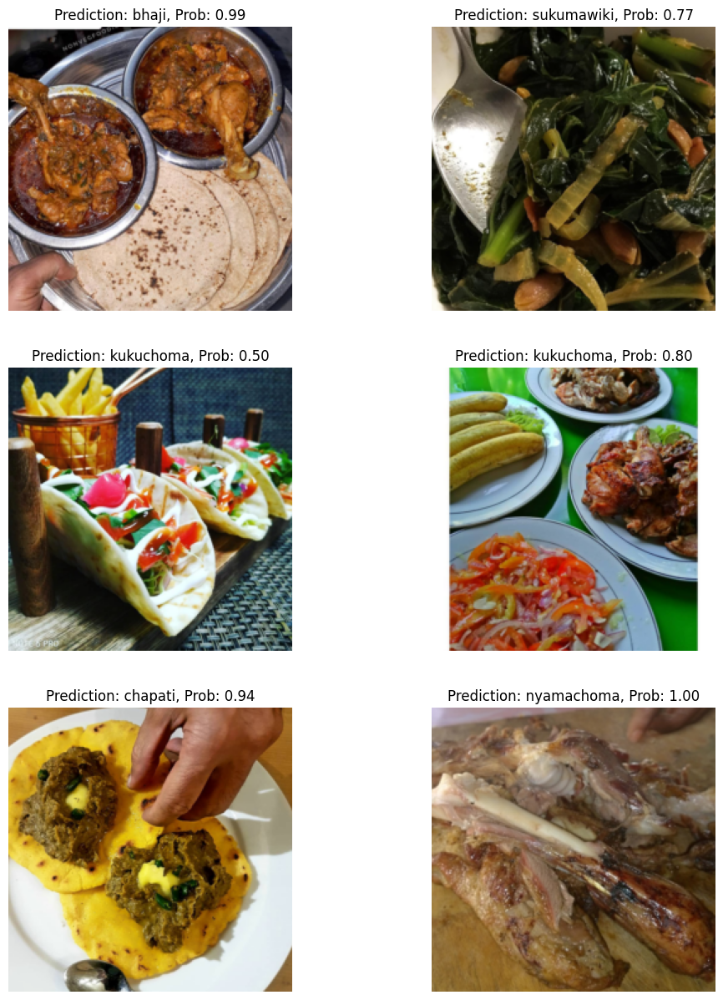

PREDICTIONS
[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 11, 0, 0, 0, 0, 0, 11, 3, 0, 3, 0, 0, 0, 12, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 9, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 6, 0, 11, 5, 0, 0, 6, 0, 0, 1, 0, 0, 0, 3, 0, 1, 0, 6, 0, 0, 0, 0, 8, 0, 0, 5, 0, 0, 0, 11, 0, 1, 3, 0, 0, 0, 0, 0, 0, 0, 1, 0, 4, 0, 0, 0, 0, 0, 7, 0, 4, 0, 0, 0, 0, 0, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 9, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 12, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 12, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 12, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 11, 1, 1, 1, 1, 1, 1, 1, 12, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 11, 1, 2, 0, 1, 1, 0, 1, 0, 1, 2, 1, 0, 1, 1, 1, 1, 1, 6, 1, 1, 1, 1, 1, 1, 1, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

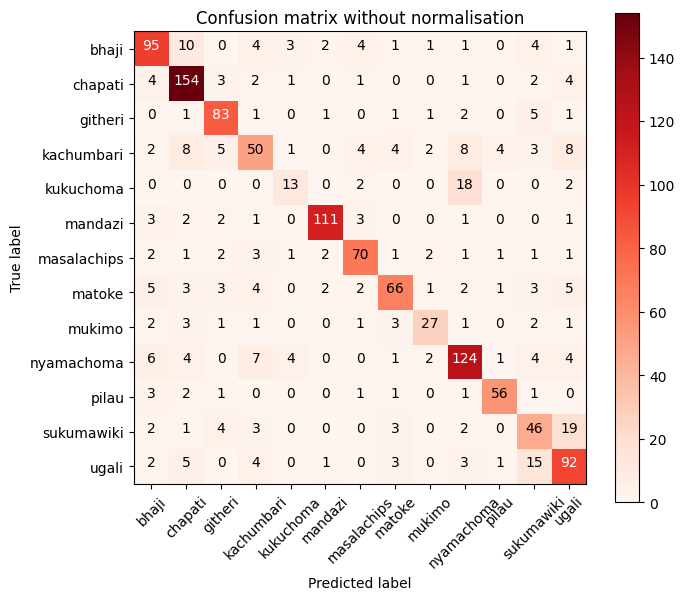

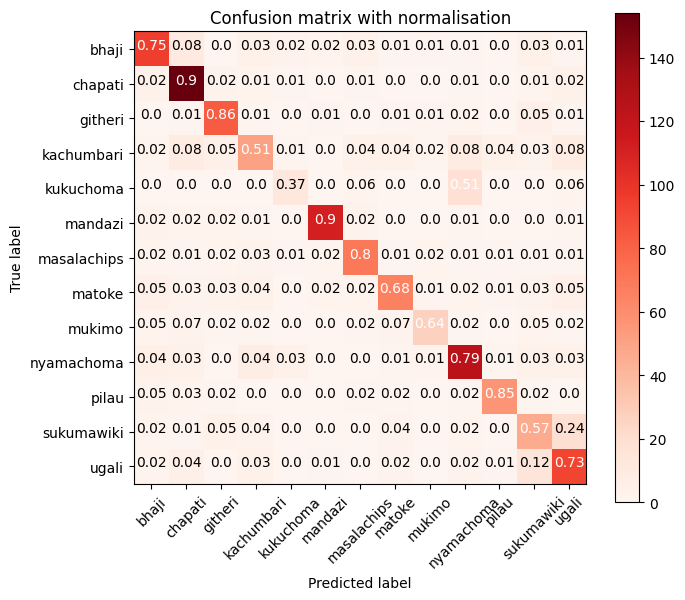

In [35]:
# validate prediction
validate_prediction(model, data_module, ckpt_path)

PREDICTIONS
[9, 1, 1, 2, 12, 3, 1, 12, 11, 0, 5, 2, 5, 12, 7, 0, 10, 0, 12, 9, 5, 2, 1, 9, 1, 10, 10, 8, 7, 6, 12, 11, 5, 11, 7, 6, 10, 1, 1, 1, 2, 11, 7, 7, 10, 6, 12, 5, 5, 5, 6, 5, 12, 7, 9, 9, 10, 5, 8, 1, 4, 0, 12, 12, 0, 0, 11, 11, 6, 1, 12, 11, 1, 3, 1, 3, 2, 9, 11, 7, 9, 1, 7, 4, 9, 9, 0, 12, 12, 6, 0, 3, 6, 0, 1, 0, 9, 12, 3, 7, 9, 1, 1, 3, 3, 5, 2, 0, 1, 5, 8, 4, 6, 12, 5, 1, 9, 2, 1, 2, 12, 11, 6, 11, 1, 1, 9, 5, 0, 5, 12, 9, 7, 2, 10, 6, 2, 9, 2, 0, 11, 1, 12, 9, 5, 9, 4, 5, 7, 1, 9, 0, 3, 1, 3, 0, 12, 6, 12, 1, 10, 5, 5, 12, 12, 2, 6, 6, 0, 5, 7, 12, 3, 2, 7, 7, 5, 2, 0, 12, 8, 7, 11, 1, 7, 12, 5, 5, 6, 12, 0, 9, 1, 12, 0, 7, 2, 3, 10, 6, 7, 0, 1, 6, 5, 0, 7, 9, 0, 2, 10, 1, 12, 0, 9, 1, 9, 12, 9, 1, 2, 1, 11, 7, 12, 5, 8, 0, 5, 7, 2, 3, 7, 7, 11, 9, 9, 2, 2, 12, 7, 4, 0, 12, 9, 1, 4, 11, 5, 1, 6, 11, 9, 11, 12, 3, 7, 7, 5, 7, 8, 11, 10, 3, 9, 3, 12, 3, 2, 1, 2, 7, 9, 12, 12, 2, 4, 5, 11, 7, 12, 0, 8, 9, 9, 5, 9, 10, 12, 5, 2, 11, 9, 1, 9, 5, 5, 9, 12, 11, 7, 9, 0, 3, 1, 5

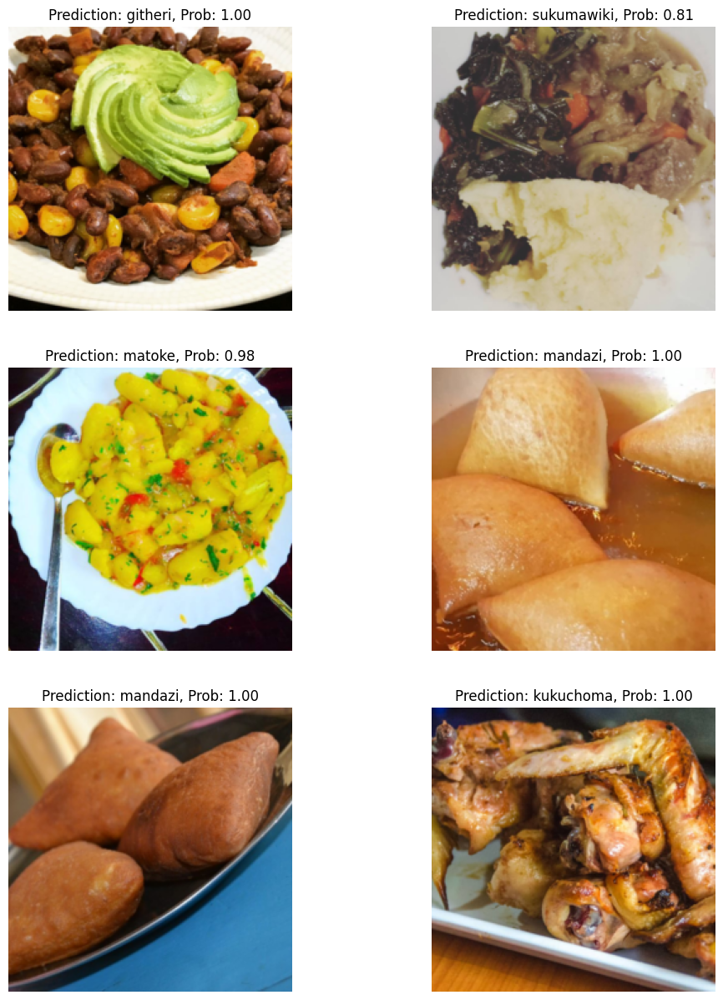

Data has been written to /content/drive/MyDrive/DLPT/Project2/submission_v13.csv


In [37]:
# test prediction
test_prediction(model, data_module, ckpt_path, submission_file_path_and_name='/content/drive/MyDrive/DLPT/Project2/submission_v13.csv')

## <font style="color:green">8. TensorBoard Log [5 Points]</font>

**Share your TensorBoard scalars logs here You can also share (not mandatory) your GitHub link, if you have pushed this project in GitHub.**


<font style="color:red">Note:</font> In light of the recent shutdown of tensorboard.dev, we have updated the submission requirements for your project. Instead of sharing a tensorboard.dev link, you are now required to upload your generated TensorBoard event files directly onto the lab. As an alternative, you may also include a screenshot of your TensorBoard output within your Jupyter notebook. This adjustment ensures that your data visualization and model training efforts are thoroughly documented and accessible for evaluation.

https://github.com/EagleDad/DEEP-LEARNING-WITH-PYTORCH/tree/master/applications/kaggleCompetitionClassification

**NOTE**
I tried to find a name for the repo that cannot be directly matched with the course competition. I tried to google with some keywords and I also tried to find it with some OpenCV releaded keywords in GitHub but I did not saw it in the firt pages of the hits. So I hope this is fine. If you have some concens, please give me a hint and I'll make the project private.

Thanks

## <font style="color:green">9. Kaggle Profile Link [50 Points]</font>

**Share your Kaggle profile link  with us here to score , points in  the competition.**

**For full points, you need a minimum accuracy of `75%` on the test data. If accuracy is less than `70%`, you gain  no points for this section.**


**Submit `submission.csv` (prediction for images in `test.csv`), in the `Submit Predictions` tab in Kaggle, to get evaluated for  this section.**

https://www.kaggle.com/dirkadler

# Conclusion

It seems to be that best results could be achieved with ResNet50. I tried different runs with different data augmentation techniques to figure out how to improve the model. I also played around with the learning rate schedule to see which apporach performs best. It turned out that a time based schedule will give good results. Also after changeing the parameters for the Plateau based approch slightly, the results are really good. I left some comments ahy I chose the data augmentation techniques that are currently in use.

# Analysing the results
Looking at the confusion matrix it can be seen that kukuchoma has the worst classification rate (0.43). Is is ofen missclassified as nyamachoma (0.54)

kukuchoma: A barbequed chicken dish popular in Kenya
nyamachoma: A specialty of grilled goat meat.

Both dishes are grilles dishes that might look equal and they are often served with side. The number of images for kukuchoma with 138 is also very low.

To improve this I'd first try to get more images and maybe more images showing jsut the dish without sides.

The second worst example is kachumbari (0.52) This is a tomato salat, which is ofte srved as a side dish to the meet. This might be the issue for the wrong classification. A object detector might be able to classify the main dish and the sides properly. Here we just try to classify an image to the coresponding dish which leads to challanges if there is more on the plate.

Regarding the batch size. More or less all runs were using batch size 64. for ResNet101 I tried first with 128
